<div style="text-align: center;">
    <img src="./Datasets/credit-score-image.jpg" alt="Imagen" />
</div>


1. ❗ [Planteamiento del Problema](#problem)  

2. 🚩 [Preparación](#preparation)  
   2.1 [Importar Librerías](#import-libraries)  
   2.2 [Cargar Datasets](#loading-datasets)  
   
3. 🧹 [Limpieza de Datos](#data-cleaning)  
   3.1 [Ajustar el Formato](#adjust-data-format)  
   3.2 [Duplicados](#duplicates)  
   3.3 [Datos erróneos](#data-entry-plus)  
   3.3.1 [Tratar Datos Basura](#filtering-trash)  
   3.3.2 [Valores Negativos](#negative-values)  
   3.3.3 [Eliminar Columnas](#dropping-columns)   

4. 📊 [EDA](#eda)  
   4.1 [Exploración](#exploratory)   
   4.2 [Analisis Univariado](#univariate_analysis)  
   4.3 [Analisis Bivariado](#bivariate_analysis)   
   4.4 [Analisis Multivariado](#multivariate_analysis) 

 5. 🗃️ [Guardar Dataset](#saving-files) 

<a id="problem"></a>
## 1.❗Planteamiento del problema

Una empresa financiera global a lo largo de los años ha recopilado datos bancarios básicos e información relacionada con el crédito. El objetivo de la dirección es construir un sistema inteligente para clasificar a las personas en tramos de puntuación crediticia y así reducir los esfuerzos manuales.

Por lo tanto, con la información relacionada con el crédito de una persona, se quiere crear un algoritmo de clasificación que pueda segregar a las personas basado en el puntaje crediticio.

## 2. 🚩 Preparación
<a id="preparation"></a>

## 2.1 Importar Librerías
<a id="import-libraries"></a>

In [1]:
import numpy as np
import pandas as pd 
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import dataset_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error
from imblearn.over_sampling import SMOTE
from xgboost import XGBRegressor
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

## 2.2 Cargar Datasets
<a id="loading-datasets"></a>

In [61]:
dataset = pd.read_csv("./Datasets/dataset.csv", dtype={'Column26': str}, low_memory=False)
dataset.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


## 3.🧹 Limpieza de Datos
<a id="data-cleaning"></a>

In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

Hay muchos símbolos mal colocados que no están relacionados con los datos y que afectarán el modelo, por lo que, será necesario ajustar la forma.

## 3.1 Ajustar el Formato
<a id="adjust-data-format"></a>

Age / Loans / Delayed Payments

In [62]:
# Convierte los valores nulos a 0, extrae los dígitos, convierte a float para manejar los NaN y decimales y, finalmente los convierte a formato entero
dataset['Age'] = dataset['Age'].fillna('0').str.extract('(\d+)').astype(float).astype(int)
dataset['Num_of_Loan'] = dataset['Num_of_Loan'].fillna('0').str.extract('(\d+)').astype(float).astype(int)
dataset['Num_of_Delayed_Payment'] = dataset['Num_of_Delayed_Payment'].fillna('0').str.extract('(\d+)').astype(float).astype(int)

Annual Income

In [63]:
# Elimina todos los caracteres en la columna que no sean dígitos o puntos y los convierte a formato float
dataset['Annual_Income'] = dataset['Annual_Income'].str.replace(r'[^0-9.]', '', regex=True)
dataset['Annual_Income'] = dataset['Annual_Income'].astype(float)

Credit Limit

In [64]:
# Reemplaza los NaN por guión, luego lo convierte a numérico y, finalmente los NaN se reemplazan por 0
dataset['Changed_Credit_Limit'] = dataset['Changed_Credit_Limit'].replace('_', np.nan)
dataset['Changed_Credit_Limit'] = pd.to_numeric(dataset['Changed_Credit_Limit'], errors='coerce')
dataset['Changed_Credit_Limit'] = dataset['Changed_Credit_Limit'].fillna(0)

Outstanding Debt

In [65]:
# Convierte a formato texto, elimina todos los caracteres que no sean dígitos o puntos, convierte a numérico y, finalmente reemplaza NaN por 0
dataset['Outstanding_Debt'] = dataset['Outstanding_Debt'].astype(str)
dataset['Outstanding_Debt'] = dataset['Outstanding_Debt'].str.replace(r'[^0-9.]', '', regex=True)
dataset['Outstanding_Debt'] = pd.to_numeric(dataset['Outstanding_Debt'], errors='coerce')
dataset['Outstanding_Debt'] = dataset['Outstanding_Debt'].fillna(0)

Invested Monthly

In [66]:
# Convertir a texto, reemplazar cadenas vacías por 0, eliminar todo los caracteres que no sean dígitos o puntos, convertrir a numérico y, finalmente reempaza NaN por 0

dataset['Amount_invested_monthly'] = dataset['Amount_invested_monthly'].astype(str)
dataset['Amount_invested_monthly'] = dataset['Amount_invested_monthly'].replace('', '0')
dataset['Amount_invested_monthly'] = dataset['Amount_invested_monthly'].str.replace(r'[^0-9.]', '')
dataset['Amount_invested_monthly'] = pd.to_numeric(dataset['Amount_invested_monthly'], errors='coerce')
dataset['Amount_invested_monthly'] = dataset['Amount_invested_monthly'].fillna(0)

Monthly Balance

In [67]:
# Convierte a cadena de texto, elimina lo que no sea dígito, punto o guión, convierte a numérico y rellena NaN con 0
dataset['Monthly_Balance'] = dataset['Monthly_Balance'].astype(str)
dataset['Monthly_Balance'] = dataset['Monthly_Balance'].str.replace(r'[^0-9.-]+', '')
dataset['Monthly_Balance'] = pd.to_numeric(dataset['Monthly_Balance'], errors='coerce')
dataset['Monthly_Balance'] = dataset['Monthly_Balance'].fillna(0)

Credit History Age

In [69]:
def parse_years_and_months(age):
    # Verificar si es una cadena de texto
    if isinstance(age, str):
        # Dividir en años y meses
        age_parts = age.split(' Years and ')
        # Extraer el número de años
        years = int(age_parts[0]) if 'Years' in age else 0 
        # Extraer el número de meses
        months_str = age_parts[1].split(' Months')[0] if 'Months' in age_parts[1] else '0' 
        months = int(months_str)
        # Calcular el total de meses
        total_months = years * 12 + months
        return total_months
    else:
        return 0  

dataset['Credit_History_Age_Months'] = dataset['Credit_History_Age'].apply(parse_years_and_months)

## 3.2 Duplicados
<a id="duplicates"></a>

In [12]:
duplicates = dataset[dataset.duplicated()]
num_duplicates = duplicates.shape[0]

if num_duplicates == 0:
    print("No hay duplicados")
else:
    print("Hay", num_duplicates, "duplicados.")

No hay duplicados


## 3.3 Datos Erróneos
<a id="data-entry"></a>

## 3.3.1 Tratar Datos Basura
<a id="filtering-trash"></a>

In [70]:
# Reemplazar varores inválidos por NaN
dataset['Payment_Behaviour'] = dataset['Payment_Behaviour'].replace('!@9#%8', np.nan)

In [71]:
# Reemplazar varores inválidos por NaN
dataset['Occupation'] = dataset['Occupation'].replace('_______', np.nan)
print(dataset['Occupation'].unique())

['Scientist' nan 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']


In [72]:
# Reemplazar varores inválidos por NaN
dataset['Credit_Mix'] = dataset['Credit_Mix'].replace('_', np.nan)
print(dataset['Credit_Mix'].unique())

[nan 'Good' 'Standard' 'Bad']


### 3.3.2 Valores Negativos
<a id="negative-values"></a>

In [73]:
# Modicar las filas donde los valores sean negativos
dataset['Num_Bank_Accounts'] = dataset['Num_Bank_Accounts'].apply(lambda x :abs (x))

## 3.3.3 Eliminar Columnas
<a id="dropping-columns"></a>

In [74]:
# Eliminar columnas no útiles para el entrenamiento
columns_to_drop = ['ID', 'Customer_ID', 'Name', 'SSN', 'Credit_History_Age']

dataset.drop(columns=columns_to_drop, inplace=True)

## 4. 📊 EDA
<a id="eda"></a>

## 4.1 Exploración
<a id="exploratory"></a>

Dimensiones

In [75]:
dataset.shape

(100000, 24)

Nombre de las columnas

In [19]:
col_names = dataset.columns
col_names

Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
       'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Credit_Score', 'Credit_History_Age_Months'],
      dtype='object')

Resumen

In [20]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Month                      100000 non-null  object 
 1   Age                        100000 non-null  int32  
 2   Occupation                 92938 non-null   object 
 3   Annual_Income              100000 non-null  float64
 4   Monthly_Inhand_Salary      84998 non-null   float64
 5   Num_Bank_Accounts          100000 non-null  int64  
 6   Num_Credit_Card            100000 non-null  int64  
 7   Interest_Rate              100000 non-null  int64  
 8   Num_of_Loan                100000 non-null  int32  
 9   Type_of_Loan               88592 non-null   object 
 10  Delay_from_due_date        100000 non-null  int64  
 11  Num_of_Delayed_Payment     100000 non-null  int32  
 12  Changed_Credit_Limit       100000 non-null  float64
 13  Num_Credit_Inquiries       980

Propiedades Estadísticas

In [21]:
dataset.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
count,100000.000000,1.000000e+05,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,119.509700,1.764157e+05,4194.170850,17.091700,22.47443,72.466040,10.761960,21.068780,28.779410,10.171791,27.754251,1426.220376,32.285173,1403.118217,178.363270,397.684413,201.221460
std,684.757313,1.429618e+06,3183.686167,117.404773,129.05741,466.422621,61.789933,14.860104,218.114813,6.880628,193.177339,1155.129026,5.116875,8306.041270,198.472368,217.132017,114.320699
min,14.000000,7.005930e+03,303.645417,0.000000,0.00000,1.000000,0.000000,-5.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,0.000000,0.000000
25%,25.000000,1.945750e+04,1625.568229,3.000000,4.00000,8.000000,2.000000,10.000000,8.000000,4.970000,3.000000,566.072500,28.052567,30.306660,58.325837,267.871374,114.000000
50%,34.000000,3.757861e+04,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,13.000000,9.250000,6.000000,1166.155000,32.305784,69.249473,116.545252,334.806633,208.000000
75%,42.000000,7.279092e+04,5957.448333,7.000000,7.00000,20.000000,6.000000,28.000000,18.000000,14.660000,9.000000,1945.962500,36.496663,161.224249,220.039055,467.670597,292.000000
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,82331.000000,1977.326102,1602.040519,404.000000


## 4.2 Análisis Univariado
<a id="univariate_analysis"></a>

Explorar la variable dependiente o target 'Credit_Score_Encoded'

    Verificar valores faltantes

In [22]:
dataset['Credit_Score'].isnull().sum()

0

    Cantidad de valores únicos

In [23]:
dataset['Credit_Score'].nunique()

3

    Valores únicos

In [24]:
dataset['Credit_Score'].unique()

array(['Good', 'Standard', 'Poor'], dtype=object)

    Distribución de Frecuencia de Valores

In [25]:
dataset['Credit_Score'].value_counts()

Credit_Score
Standard    53174
Poor        28998
Good        17828
Name: count, dtype: int64

    Porcentaje de Distribución de Frecuencia de Valores

In [26]:
dataset['Credit_Score'].value_counts()/len(dataset)

Credit_Score
Standard    0.53174
Poor        0.28998
Good        0.17828
Name: count, dtype: float64

    Visualización de la Distribución de Frecuencias

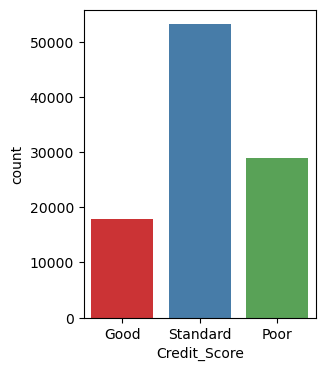

In [27]:
f, ax = plt.subplots(figsize=(3, 4))
ax = sns.countplot(x="Credit_Score", data=dataset, palette="Set1")
plt.show()

## 4.3 Análisis Bivariado
<a id="bivariate_analysis"></a>

Tipos de Variables

**Explorando las Variables Categóricas**

In [28]:
categorical = [var for var in dataset.columns if dataset[var].dtype=='O']

print('Hay {} variables categóricas\n'.format(len(categorical)))
print('Las variables categóricas son :', categorical)

Hay 7 variables categóricas

Las variables categóricas son : ['Month', 'Occupation', 'Type_of_Loan', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']


In [29]:
dataset[categorical].head()

,Month,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
0,January,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",NaN,No,High_spent_Small_value_payments,Good
1,February,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,Low_spent_Large_value_payments,Good
2,March,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,Low_spent_Medium_value_payments,Good
3,April,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,Low_spent_Small_value_payments,Good
4,May,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,High_spent_Medium_value_payments,Good


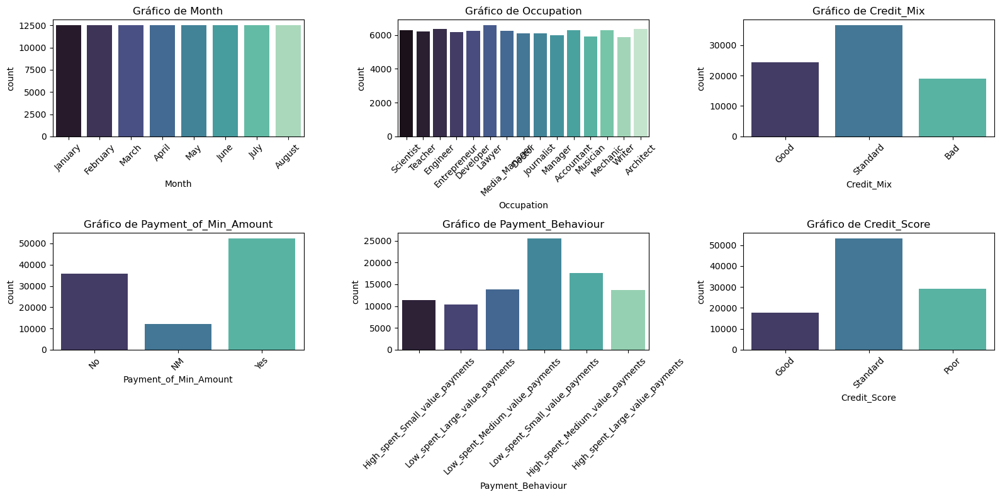

In [51]:
categorical_columns = [col for col in categorical if dataset[col].nunique() <= 20]

num_cols = 3  
num_plots = len(categorical_columns)
num_rows = (num_plots + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 8))
axes = axes.flatten()  


for i, col in enumerate(categorical_columns):
    sns.countplot(x=dataset[col], palette="mako", ax=axes[i])
    axes[i].set_title(f'Gráfico de {col}')
    axes[i].tick_params(axis='x', rotation=45)


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

#plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()
plt.show()

    Valores Faltantes

In [39]:
dataset[categorical].isnull().sum()

Month                        0
Occupation                7062
Type_of_Loan             11408
Credit_Mix               20195
Payment_of_Min_Amount        0
Payment_Behaviour         7600
Credit_Score                 0
dtype: int64

    Recuento de Frecuencia

In [40]:
for var in categorical: 
    print(dataset[var].value_counts())

Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: count, dtype: int64
Occupation
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64
Type_of_Loan
Not Specified                                                                                                                         1408
Credit-Builder Loan                                                                                                                   1280
Personal Loan                                                                                                                         1272
Debt Consolidation Loan    

    Distribución de Frecuencias

In [41]:
for var in categorical:  
    print(dataset[var].value_counts()/float(len(dataset)))

Month
January     0.125
February    0.125
March       0.125
April       0.125
May         0.125
June        0.125
July        0.125
August      0.125
Name: count, dtype: float64
Occupation
Lawyer           0.06575
Architect        0.06355
Engineer         0.06350
Scientist        0.06299
Mechanic         0.06291
Accountant       0.06271
Developer        0.06235
Media_Manager    0.06232
Teacher          0.06215
Entrepreneur     0.06174
Doctor           0.06087
Journalist       0.06085
Manager          0.05973
Musician         0.05911
Writer           0.05885
Name: count, dtype: float64
Type_of_Loan
Not Specified                                                                                                                         0.01408
Credit-Builder Loan                                                                                                                   0.01280
Personal Loan                                                                                                  

    Cardinalidad: Número de Etiquetas

In [42]:
for var in categorical:
    print(var, ' contains ', len(dataset[var].unique()), ' labels')

Month  contains  8  labels
Occupation  contains  16  labels
Type_of_Loan  contains  6261  labels
Credit_Mix  contains  4  labels
Payment_of_Min_Amount  contains  3  labels
Payment_Behaviour  contains  7  labels
Credit_Score  contains  3  labels


**Explorando las Variables Numéricas**

In [45]:
numerical = [var for var in dataset.columns if dataset[var].dtype!='O']

print('Hay {} variables numéricas\n'.format(len(numerical)))
print('Las variables numéricas son:', numerical)

Hay 17 variables numéricas

Las variables numéricas son: ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_History_Age_Months']


In [46]:
dataset[numerical].head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
0,23,19114.12,1824.843333,3,4,3,4,3,7,11.27,4.0,809.98,26.822620,49.574949,80.415295,312.494089,265
1,23,19114.12,NaN,3,4,3,4,-1,0,11.27,4.0,809.98,31.944960,49.574949,118.280222,284.629162,0
2,500,19114.12,NaN,3,4,3,4,3,7,0.00,4.0,809.98,28.609352,49.574949,81.699521,331.209863,267
3,23,19114.12,NaN,3,4,3,4,5,4,6.27,4.0,809.98,31.377862,49.574949,199.458074,223.451310,268
4,23,19114.12,1824.843333,3,4,3,4,6,0,11.27,4.0,809.98,24.797347,49.574949,41.420153,341.489231,269


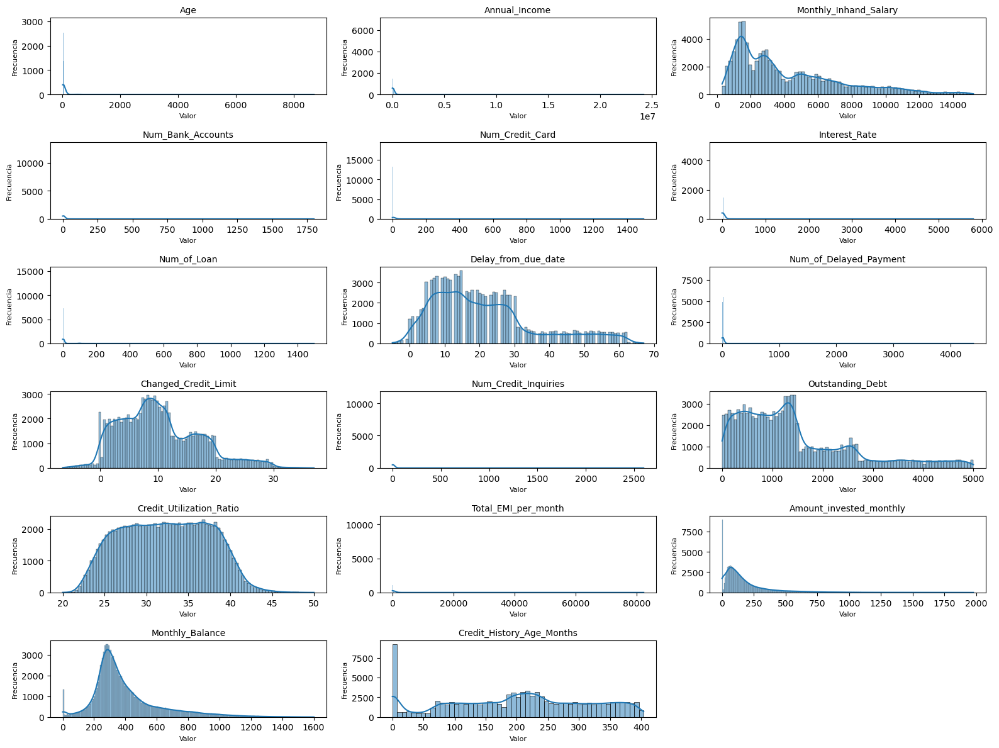

In [52]:
num_columns = 3
num_rows = (len(numerical) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 12))

axes = axes.flatten()

for i, column in enumerate(numerical):
    sns.histplot(dataset[column], kde=True, ax=axes[i])
    axes[i].set_title(column, fontsize=10)
    axes[i].set_xlabel('Valor', fontsize=8)
    axes[i].set_ylabel('Frecuencia', fontsize=8)

for j in range(len(numerical), num_columns * num_rows):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

    Valores Faltantes

In [53]:
dataset[numerical].isnull().sum()

Age                              0
Annual_Income                    0
Monthly_Inhand_Salary        15002
Num_Bank_Accounts                0
Num_Credit_Card                  0
Interest_Rate                    0
Num_of_Loan                      0
Delay_from_due_date              0
Num_of_Delayed_Payment           0
Changed_Credit_Limit             0
Num_Credit_Inquiries          1965
Outstanding_Debt                 0
Credit_Utilization_Ratio         0
Total_EMI_per_month              0
Amount_invested_monthly          0
Monthly_Balance                  0
Credit_History_Age_Months        0
dtype: int64

    Valores Atípicos

In [54]:
print(round(dataset[numerical].describe()),2)

            Age  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
count  100000.0       100000.0                84998.0           100000.0   
mean      120.0       176416.0                 4194.0               17.0   
std       685.0      1429618.0                 3184.0              117.0   
min        14.0         7006.0                  304.0                0.0   
25%        25.0        19458.0                 1626.0                3.0   
50%        34.0        37579.0                 3094.0                6.0   
75%        42.0        72791.0                 5957.0                7.0   
max      8698.0     24198062.0                15205.0             1798.0   

       Num_Credit_Card  Interest_Rate  Num_of_Loan  Delay_from_due_date  \
count         100000.0       100000.0     100000.0             100000.0   
mean              22.0           72.0         11.0                 21.0   
std              129.0          466.0         62.0                 15.0   
min            

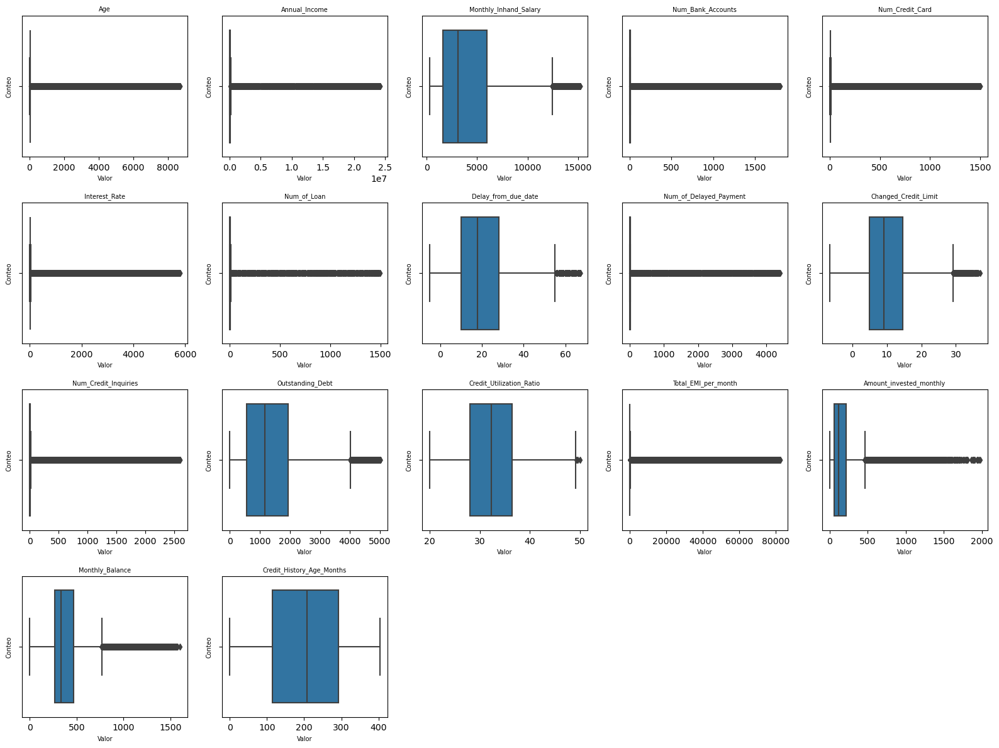

In [56]:
num_columns = 5
num_rows = (len(numerical) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 12))

axes = axes.flatten()

for i, column in enumerate(numerical):
    sns.boxplot(x=dataset[column], ax=axes[i])
    axes[i].set_title(column, fontsize=7)  
    axes[i].set_xlabel('Valor', fontsize=7)  
    axes[i].set_ylabel('Conteo', fontsize=7)  

for j in range(len(numerical), num_columns*num_rows):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

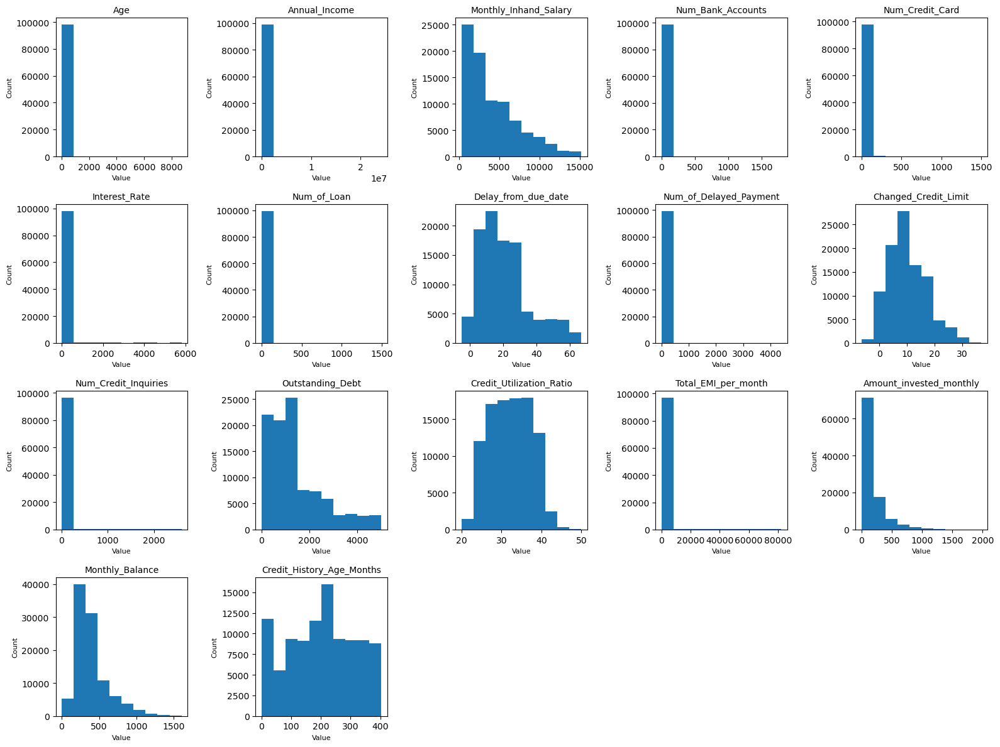

In [57]:
num_columns = 5
num_rows = (len(numerical) + num_columns - 1) // num_columns  # Calcular el número de filas necesarias para los subplots

fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 12))

axes = axes.flatten()

for i, column in enumerate(numerical):
    axes[i].hist(dataset[column].dropna(), bins=10)  
    axes[i].set_title(column, fontsize=10)  
    axes[i].set_xlabel('Value', fontsize=8)  
    axes[i].set_ylabel('Count', fontsize=8)  

for j in range(len(numerical), num_columns * num_rows):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [58]:
for column in numerical:
    IQR = dataset[column].quantile(0.75) - dataset[column].quantile(0.25)
    Lower_fence = dataset[column].quantile(0.25) - (IQR * 3)
    Upper_fence = dataset[column].quantile(0.75) + (IQR * 3)
    print(f'Los valores atípicos de {column} son aquellos < {Lower_fence} o > {Upper_fence}')

Los valores atípicos de Age son aquellos < -26.0 o > 93.0
Los valores atípicos de Annual_Income son aquellos < -140542.76 o > 232791.18
Los valores atípicos de Monthly_Inhand_Salary son aquellos < -11370.072083333333 o > 18953.088645833333
Los valores atípicos de Num_Bank_Accounts son aquellos < -9.0 o > 19.0
Los valores atípicos de Num_Credit_Card son aquellos < -5.0 o > 16.0
Los valores atípicos de Interest_Rate son aquellos < -28.0 o > 56.0
Los valores atípicos de Num_of_Loan son aquellos < -10.0 o > 18.0
Los valores atípicos de Delay_from_due_date son aquellos < -44.0 o > 82.0
Los valores atípicos de Num_of_Delayed_Payment son aquellos < -22.0 o > 48.0
Los valores atípicos de Changed_Credit_Limit son aquellos < -24.100000000000005 o > 43.730000000000004
Los valores atípicos de Num_Credit_Inquiries son aquellos < -15.0 o > 27.0
Los valores atípicos de Outstanding_Debt son aquellos < -3573.5975 o > 6085.6325
Los valores atípicos de Credit_Utilization_Ratio son aquellos < 2.7202770771

## 4.4 Análisis Multivariado
<a id="multivariate_analysis"></a>

Importante para descubrir patrones y relaciones entre variables en el conjunto de datos.

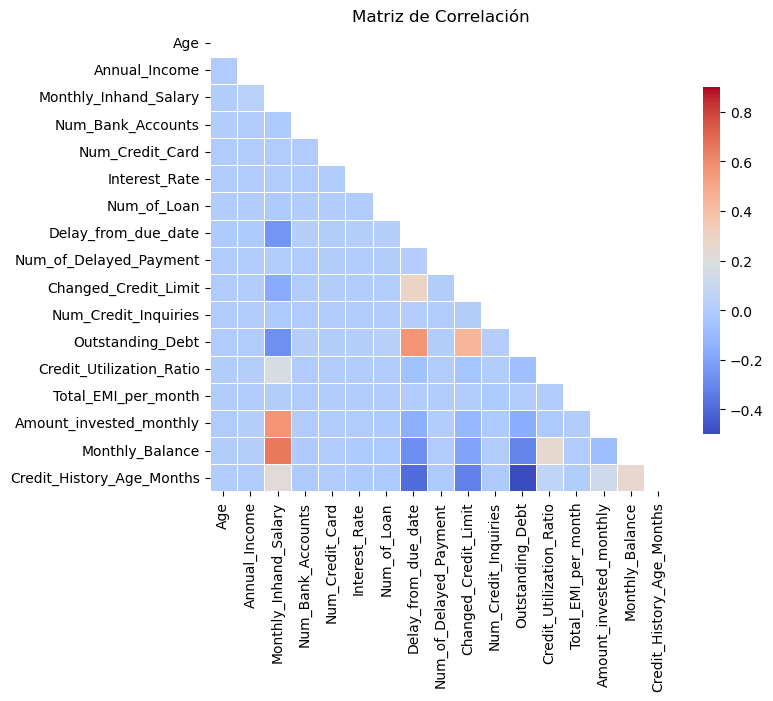

In [59]:
corr = dataset[numerical].corr(method='pearson')

# Crear una máscara para la parte superior de la matriz de correlación
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(8, 6))

sns.heatmap(corr, 
            mask=mask, 
            vmax=0.9, 
            square=True, 
            annot=True, 
            fmt='.2f',  
            linewidths=.5,  
            cbar_kws={"shrink": .75}, 
            cmap='coolwarm')  


plt.title('Matriz de Correlación')
plt.show()

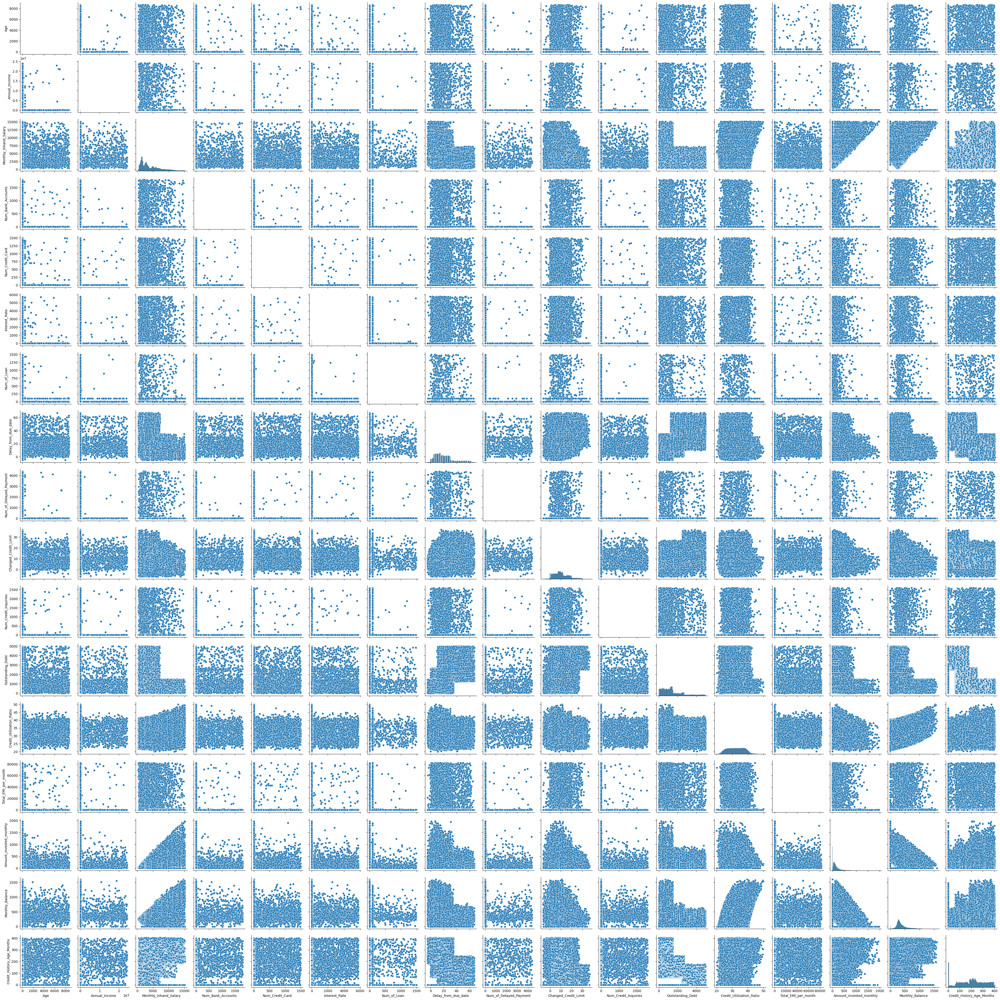

In [60]:
sns.pairplot(dataset[numerical], kind='scatter', diag_kind='hist')
plt.show()

## 5. 🗃️ Guardar Dataset
<a id="saving-files"></a> 

In [77]:
dataset_new = dataset.copy()

# Guardar el nuevo DataFrame en un archivo CSV
dataset_new.to_csv('./Datasets/dataset_new.csv', index=False)

print("Nuevo dataset guardado en 'dataset_new.csv'")

Nuevo dataset guardado en 'dataset_new.csv'
